In [1]:
%%time
# ----------------- 0) BEFORE importing tensorflow -----------------
import os
os.environ["PYTHONHASHSEED"]          = "42"
os.environ["TF_DETERMINISTIC_OPS"]    = "1"
os.environ["TF_CUDNN_DETERMINISTIC"]  = "1"
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"   # or ":16:8" on some stacks
os.environ["TF_XLA_FLAGS"]            = "--tf_xla_auto_jit=0"  # avoid XLA nondet
# Optional: disable cuBLASLt autotune on some TFs
os.environ["TF_USE_CUBLASLT"]         = "0"

# ----------------- 1) Now import tensorflow -----------------
import tensorflow as tf
tf.config.threading.set_intra_op_parallelism_threads(1)
tf.config.threading.set_inter_op_parallelism_threads(1)

# ----------------- 2) Seed everything -----------------
import numpy as np, random
GLOBAL_SEED = 42
random.seed(GLOBAL_SEED)
np.random.seed(GLOBAL_SEED)
tf.random.set_seed(GLOBAL_SEED)
try:
    tf.keras.utils.set_random_seed(GLOBAL_SEED)
except Exception:
    pass

2025-11-12 16:50:27.951061: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1762987827.968382 1816069 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1762987827.973684 1816069 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-11-12 16:50:27.990389: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


CPU times: user 9.45 s, sys: 373 ms, total: 9.83 s
Wall time: 3.18 s


In [2]:
# Watermark notebook - import packages
import glob, warnings, mcaap, sys, pickle, platform, multiprocessing, psutil, os, json
#-----------------------------------------------------------------------------------------------------------------#
# Command to make all plots interactive
%matplotlib ipympl
#-----------------------------------------------------------------------------------------------------------------#
# Import packages as
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
#-----------------------------------------------------------------------------------------------------------------#
# Import packages from
from datetime import datetime
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from scipy.optimize import linear_sum_assignment
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, adjusted_rand_score, adjusted_mutual_info_score, confusion_matrix, normalized_mutual_info_score, silhouette_score
#-----------------------------------------------------------------------------------------------------------------#
# ML Packages 
import tensorflow as tf
from keras.utils import *
from tensorflow.keras import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, CSVLogger
#-----------------------------------------------------------------------------------------------------------------#
print(f"Python Platform: {platform.platform()}")
print(f"Tensorflow Version: {tf.__version__}")
print(f"Keras Version: {tf.keras.__version__}")
print()
print(f"Python {sys.version}")
print()
print(f"Number of cores available for processing: {multiprocessing.cpu_count()}")
print(f"Total memory available: {psutil.virtual_memory().total / 1e9, 'GB'}")
print()
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU'))) # check if TensorFlow is using GPU
#-----------------------------------------------------------------------------------------------------------------#
# Ignore non-critical warnings
warnings.filterwarnings('ignore')
#-----------------------------------------------------------------------------------------------------------------#
# Load all data
X_cwt_scaled = np.load('X_cwt_scaled.npy')
print('Loaded scalograms')
X_envelope_scaled = np.load('X_envelope_scaled.npy')
print('Loaded envelopes')
X_sin_scaled = np.load('X_sin_scaled.npy')
print('Loaded sines')
X_cos_scaled = np.load('X_cos_scaled.npy')
print('Loaded cosines')
X_label = np.load('X_label.npy')
print('Total inputs: '+str(X_cwt_scaled.shape[0]))
print('Scalogram dimensions: '+str(X_cwt_scaled.shape))
print('Envelope dimensions: '+str(X_envelope_scaled.shape))
print('Wavelet Phase Spectrum dimensions (sine): '+str(X_sin_scaled.shape))
print('Wavelet Phase Spectrum dimensions (cosine): '+str(X_cos_scaled.shape))

Python Platform: Linux-5.15.0-1083-nvidia-x86_64-with-glibc2.35
Tensorflow Version: 2.18.0
Keras Version: 3.8.0

Python 3.10.18 (main, Jun  5 2025, 13:14:17) [GCC 11.2.0]

Number of cores available for processing: 128
Total memory available: (2164.307111936, 'GB')

Num GPUs Available: 2
Loaded scalograms
Loaded envelopes
Loaded sines
Loaded cosines
Total inputs: 32535
Scalogram dimensions: (32535, 64, 1200)
Envelope dimensions: (32535, 1, 1200)
Wavelet Phase Spectrum dimensions (sine): (32535, 64, 1200)
Wavelet Phase Spectrum dimensions (cosine): (32535, 64, 1200)


---
Ancillary function to evaluate latent space

---
Load pre-trained InfraCoder

In [3]:
%%time
# Need to rebuild model and load weights 
infracoder, attn_model = mcaap.build_InfraCoder(num_freq_samples=64, num_time_samples=800, K_s=6, K_e=3, K_p=6, lr=1e-3, l2_lambda=1e-4, return_attention=True) # rebuild graphs
#-----------------------------------------------------------------------------------------------------------------------#
# Model weights from best epoch
infracoder.load_weights('InfraCoder100.keras')
attn_model.load_weights('InfraCoder100_Attention.keras')

I0000 00:00:1762987842.349405 1816069 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 79194 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-80GB, pci bus id: 0000:87:00.0, compute capability: 8.0
I0000 00:00:1762987842.351053 1816069 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 79194 MB memory:  -> device: 1, name: NVIDIA A100-SXM4-80GB, pci bus id: 0000:90:00.0, compute capability: 8.0


CPU times: user 2.16 s, sys: 985 ms, total: 3.15 s
Wall time: 3.07 s


---
Get latent vectors

In [4]:
%%time
# Construct pretrain model
g1 = infracoder.get_layer("scalo_proj1x1").output
g1_dec = activations.relu(g1) 
g2 = infracoder.get_layer("env_proj1x1").output
g2_dec = activations.relu(g2) 
g3 = infracoder.get_layer("phase_proj1x1").output
g3_dec = activations.gelu(g3) 
#-----------------------------------------------------------------------------------------------------------------------#
# Merge via concatenation in the channel dimension
z_grid = tf.keras.layers.Concatenate(axis=-1, name="z_grid_lat")([g1_dec, g2_dec, g3_dec])  # [B,T',Ksum]
pretrain_model = tf.keras.Model(
    inputs=infracoder.inputs,
    outputs=z_grid, # Merged trainable latent space
    name="InfraCoder_Pretrain")
z_grid.shape

CPU times: user 5.41 ms, sys: 0 ns, total: 5.41 ms
Wall time: 5.3 ms


(None, 200, 15)

In [4]:
%%time
# Need to center crop dataset
def center_crop(x, fs=40, trim_s=5):
    """
    Trim `trim_s` seconds from start and end along the time axis.
    Assumes time is axis=1 for 2D [F,T] or 3D [F,T,C].
    """
    trim = trim_s * fs
    T = x.shape[2]
    return x[:, :, trim:T-trim, ...]

# Example usage for numpy arrays
X_scalo_crop = center_crop(X_cwt_scaled, fs=40, trim_s=5)   # [N, F, 800, 1]
X_env_crop = center_crop(X_envelope_scaled, fs=40, trim_s=5)   # [N, 1, 800, 1]
X_sin_crop = center_crop(X_sin_scaled, fs=40, trim_s=5)   # [N, F, 800, 1]
X_cos_crop = center_crop(X_cos_scaled, fs=40, trim_s=5)   # [N, F, 800, 1]
X_scalo_crop.shape

CPU times: user 12 μs, sys: 11 μs, total: 23 μs
Wall time: 26.9 μs


(32535, 64, 800)

---
Evaluate pretrained latent space

2025-11-10 20:22:12.354543: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}
I0000 00:00:1762827733.193885 2179585 cuda_dnn.cc:529] Loaded cuDNN version 90300


1017/1017 ━━━━━━━━━━━━━━━━━━━━ 22s 13ms/step
GMM counts: [10529, 8010, 13996]
ARI: 0.8507 | AMI: 0.7906 | NMI: 0.7907 | Silhouette: 0.1259
Hungarian-mapped accuracy: 0.9388 | Mapping: {np.int64(2): np.int64(0), np.int64(1): np.int64(1), np.int64(0): np.int64(2)}
Plotting T-SNE
Plotting PCA
CPU times: user 30min 41s, sys: 20.6 s, total: 31min 2s
Wall time: 2min 23s


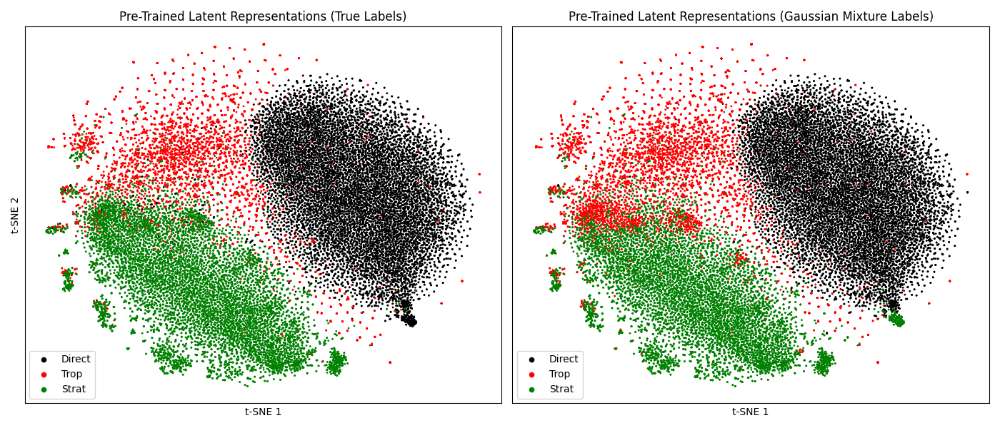

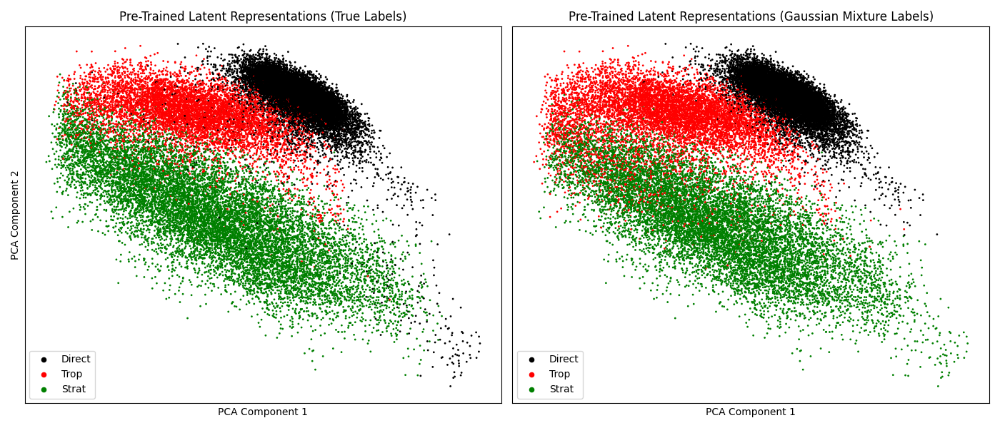

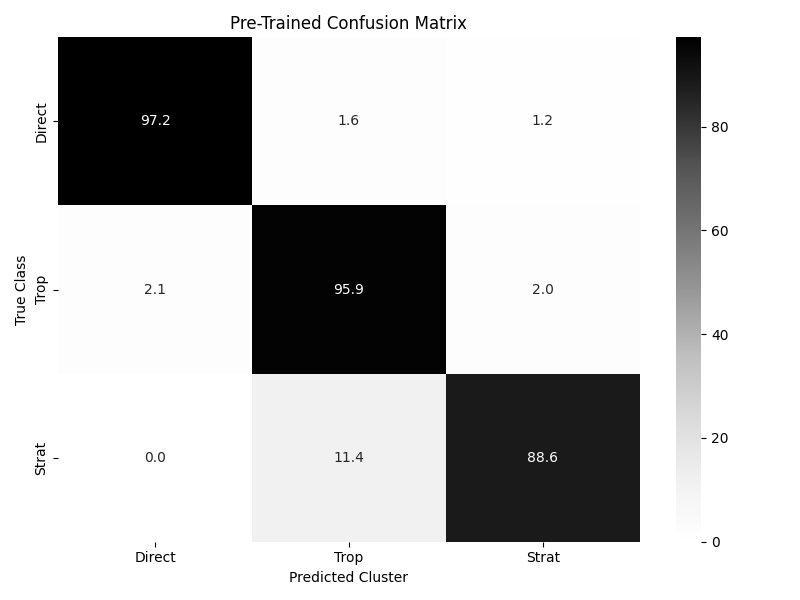

In [6]:
%%time
res_tmp = mcaap.eval_latent_space(
    proj_model=pretrain_model,
    data_inputs=[X_scalo_crop, X_env_crop, X_sin_crop, X_cos_crop],
    X_label=X_label,
    n_clusters=3,
    temporal_bin=True,
    cluster_ids=[2,1,0],
    title_1='Pre-Trained Latent Representations (True Labels)',
    title_2='Pre-Trained Latent Representations (Gaussian Mixture Labels)',
    title_3='Pre-Trained Confusion Matrix',
    standardize=True,
    compute_acc=True,
    plot=True,
    random_state = GLOBAL_SEED, 
    outpath_tsne="TSNE_Pretrained_Latent.png", 
    outpath_confusion_matrix="Pretrained_Confusion_Matrix.png")

---
Construct projection head for fine-tuning

In [5]:
%%time
# Ancillary functions
class TemporalBinPool(tf.keras.layers.Layer):
    """Mean over S equal bins on time. Input [B,T,D] -> Output [B,S*D] (flattened)."""
    def __init__(self, n_bins: int, flatten: bool = True, **kw):
        super().__init__(**kw)
        self.n_bins = n_bins
        self.flatten = flatten

    def call(self, x):
        # x: [B, T, D]
        B = tf.shape(x)[0]
        T = tf.shape(x)[1]
        D = x.shape[-1]  # static ok

        # crop T so it's divisible by S
        bin_len = tf.math.floordiv(T, self.n_bins)
        T_use  = bin_len * self.n_bins
        x = x[:, :T_use, :]                         # [B, T_use, D]
        x = tf.reshape(x, [B, self.n_bins, bin_len, D])  # [B, S, L, D]
        x = tf.reduce_mean(x, axis=2)               # [B, S, D]

        if self.flatten:
            x = tf.reshape(x, [B, self.n_bins * D]) # [B, S*D]
        return x

# --- BEFORE compile: define the ramp variable and the loss that uses it ---
lambda_kl = tf.Variable(0.0, trainable=False, dtype=tf.float32)
@tf.keras.utils.register_keras_serializable(package="infra")
def dec_kl_loss(y_true, y_pred, eps=1e-12):
    # y_true is P, y_pred is Q
    y_true = tf.stop_gradient(tf.cast(tf.clip_by_value(y_true, eps, 1.0), y_pred.dtype))
    y_pred = tf.cast(tf.clip_by_value(y_pred, eps, 1.0), y_true.dtype)
    per_row = tf.reduce_sum(y_true * (tf.math.log(y_true) - tf.math.log(y_pred)), axis=-1)
    kl = tf.reduce_mean(per_row)
    return lambda_kl * kl  # <-- scaled inside the loss

CPU times: user 871 μs, sys: 1.1 ms, total: 1.97 ms
Wall time: 1.5 ms


In [6]:
%%time
# Construct joint latent space
g1 = infracoder.get_layer("scalo_proj1x1").output
g1_dec = activations.relu(g1) 
g2 = infracoder.get_layer("env_proj1x1").output
g2_dec = activations.relu(g2) 
g3 = infracoder.get_layer("phase_proj1x1").output
g3_dec = activations.gelu(g3) 
#-----------------------------------------------------------------------------------------------------------------------#
# Merge via concatenation in the channel dimension
z_grid = Concatenate(axis=-1, name="z_grid_lat")([g1_dec, g2_dec, g3_dec])  # [B,T',Ksum]
pool = TemporalBinPool(n_bins=10, flatten=True, name='temporal_bin_pool')
Z_proj = pool(z_grid) # [None, 150]
#-----------------------------------------------------------------------------------------------------------------------#
# Projection head (keep dimensions the same to preserve geometry)
Z_proj = Dense(150, use_bias=False, kernel_initializer=tf.keras.initializers.HeUniform(seed=200), name='Proj_Dense_1')(Z_proj) # 24 is best for normal superpod - use 200 for superpod -p short
Z_proj = LayerNormalization(epsilon=1e-6, name='Proj_LN_1')(Z_proj)
#-----------------------------------------------------------------------------------------------------------------------#
# Clustering layer
q = mcaap.ClusteringLayer(n_clusters=3, alpha=1.0, temperature=1.3, use_l2_norm=False, # set l2 norm to be false because we want magnitude to play a role
                          name="cluster_layer")(Z_proj)
#-----------------------------------------------------------------------------------------------------------------------#
# --- recon heads (rename so they have stable names) ---
scal_out, env_out, phase_out = infracoder(infracoder.inputs)
#-----------------------------------------------------------------------------------------------------------------------#
# Build model with named outputs
outputs = [q, scal_out, env_out, phase_out]
dec_model = Model(inputs=[*infracoder.inputs],
                  outputs=outputs,
                  name="Deep_Embedded_Clustering")
#-----------------------------------------------------------------------------------------------------------------------#
# Need to make dummy zeros since we dont have ground-truth targets
dummy_zeros = np.zeros((X_cwt_scaled.shape[0],), dtype=np.float32)  # same batch size as your training data
#-----------------------------------------------------------------------------------------------------------------------#
# Define losses and weights
losses = [
    dec_kl_loss, # q
    tf.keras.losses.MeanSquaredError(),  # scalogram
    tf.keras.losses.MeanSquaredError(),  # envelope
    mcaap.phase_angle_loss,  # phase
]
loss_weights = [
    1, # lambda for kl loss (this will get scaled during training)
    1/3,  # 3 reconstruction modalities
    1/3,
    1/3,
]
#-----------------------------------------------------------------------------------------------------------------------#
# Compile model
from tensorflow.keras import mixed_precision
# Enable mixed precision globally
mixed_precision.set_global_policy('mixed_float16')
# Create base optimizer
base_opt = tf.keras.optimizers.Adam(learning_rate=1e-4)
# Wrap with automatic loss scaling (prevents underflow)
opt = mixed_precision.LossScaleOptimizer(base_opt)
dec_model.compile(optimizer=opt,
                  loss=losses, loss_weights=loss_weights)
dec_model.summary()

Model: "Deep_Embedded_Clustering"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Input_Phase_Sine    │ (None, 64, 800,   │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Input_Phase_Cosine  │ (None, 64, 800,   │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Input_Scalogram     │ (None, 64, 800,   │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 64, 800,   │          0 │ Input_Phase_Sine… │
│ (Concatenate)       │ 2)                │            │ Input_Phase_Cosi… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv_1a_Scalogram   │ (None, 64, 800,   │         40 │ Input_Scalogram[… │
│ (Conv2D)            │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv_1a_Phase       │ (None, 64, 800,   │         76 │ concatenate[0][0] │
│ (Conv2D)            │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 64, 800,   │         16 │ Conv_1a_Scalogra… │
│ (BatchNormalizatio… │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 800,   │         16 │ Conv_1a_Phase[0]… │
│ (BatchNormalizatio… │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 64, 800,   │          0 │ batch_normalizat… │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Input_Envelope      │ (None, 1, 800, 1) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_14 (ReLU)     │ (None, 64, 800,   │          0 │ batch_normalizat… │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv_1b_Scalogram   │ (None, 32, 400,   │        296 │ re_lu[0][0]       │
│ (Conv2D)            │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ squeeze (Squeeze)   │ (None, 800, 1)    │          0 │ Input_Envelope[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv_1b_Phase       │ (None, 32, 400,   │        296 │ re_lu_14[0][0]    │
│ (Conv2D)            │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 400,   │         32 │ Conv_1b_Scalogra… │
│ (BatchNormalizatio… │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv_1a_Hilbert     │ (None, 800, 4)    │         16 │ squeeze[0][0]     │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 400,   │         32 │ Conv_1b_Phase[0]… │
│ (BatchNormalizatio… │ 8)                │            │                 

 Total params: 221,825 (866.50 KB)

 Trainable params: 221,273 (864.35 KB)

 Non-trainable params: 552 (2.16 KB)

CPU times: user 112 ms, sys: 9.23 ms, total: 121 ms
Wall time: 120 ms


2025-11-11 15:10:27.585386: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}
I0000 00:00:1762895428.431864 3864455 cuda_dnn.cc:529] Loaded cuDNN version 90300


1017/1017 ━━━━━━━━━━━━━━━━━━━━ 22s 13ms/step
GMM counts: [10829, 7682, 14024]
ARI: 0.8678 | AMI: 0.8047 | NMI: 0.8047 | Silhouette: 0.1706
Hungarian-mapped accuracy: 0.9468 | Mapping: {np.int64(2): np.int64(0), np.int64(1): np.int64(1), np.int64(0): np.int64(2)}
Initialized `cluster_layer` centroids with shape (3, 150).
Plotting T-SNE
Plotting PCA
CPU times: user 36min 30s, sys: 41.1 s, total: 37min 11s
Wall time: 2min 31s


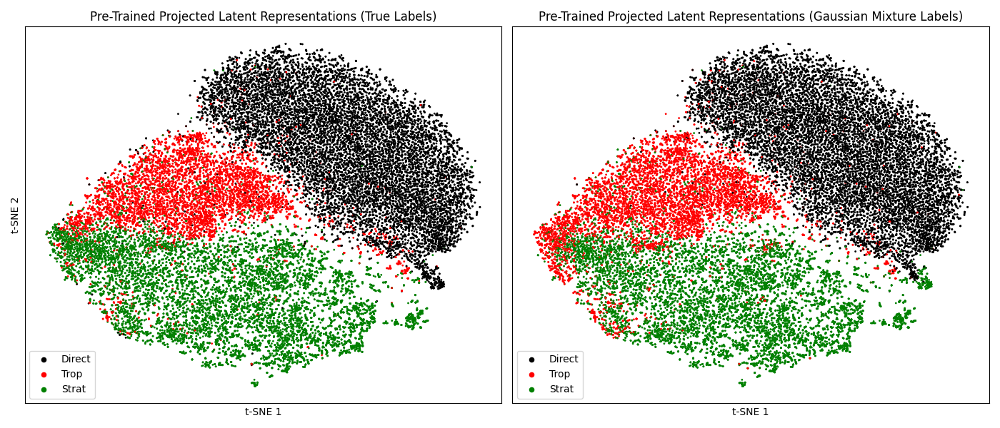

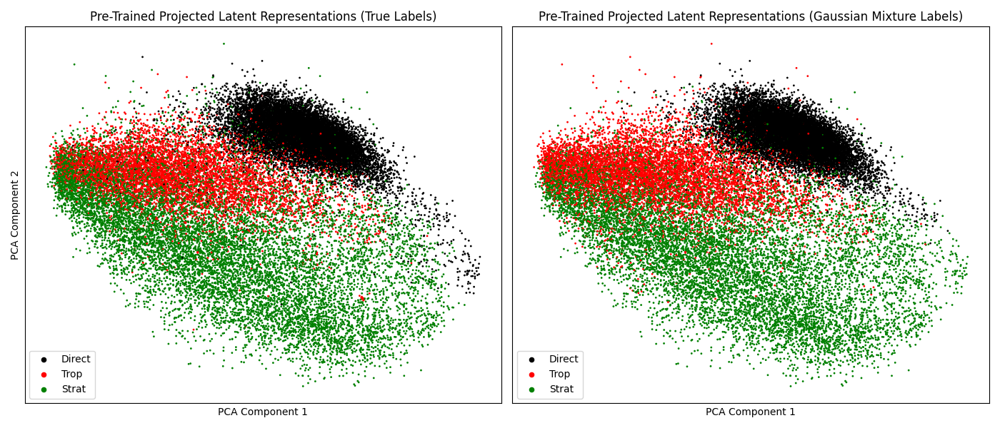

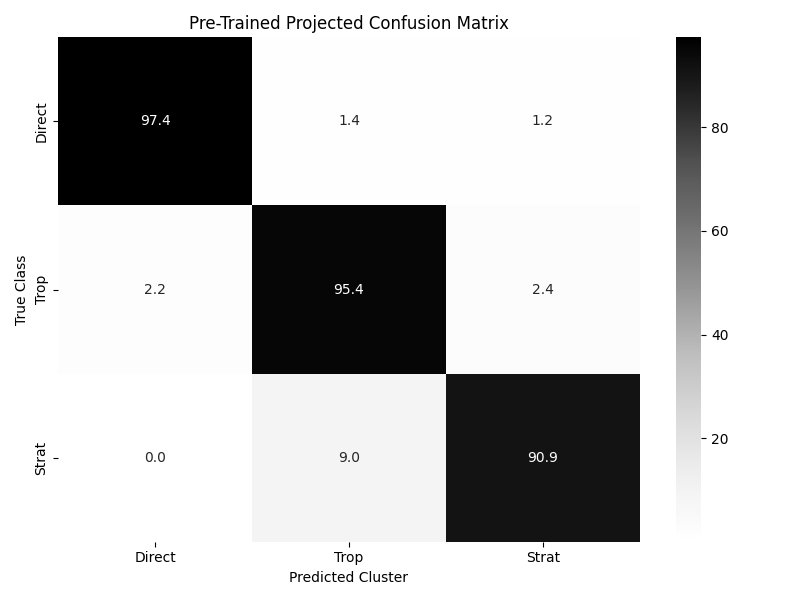

In [7]:
%%time
# Evaluate projection head and initialize cluster layer centroids
proj_model = tf.keras.Model(
    inputs=dec_model.inputs,
    outputs=dec_model.get_layer("Proj_LN_1").output)

res_proj = mcaap.eval_latent_space(
    proj_model=proj_model,
    dec_model=dec_model,
    data_inputs=[X_scalo_crop, X_env_crop, X_sin_crop, X_cos_crop],
    X_label=X_label,
    n_clusters=3,
    cluster_ids=[2,1,0],
    title_1='Pre-Trained Projected Latent Representations (True Labels)',
    title_2='Pre-Trained Projected Latent Representations (Gaussian Mixture Labels)',
    title_3='Pre-Trained Projected Confusion Matrix',
    standardize=True,
    initialize_centroids=True,
    compute_acc=True,
    plot=True,
    cluster_layer_name="cluster_layer",
    random_state = GLOBAL_SEED)

---
Augment tropospheric class

In [8]:
%%time
def balance_by_augment_trop(X_scalo, X_env, X_sin, X_cos, X_label,
                            n_clusters=3,
                            trop_id=1,
                            max_t_shift=2.5, 
                            noise_percentage=5, 
                            trim_sec=0,
                            sampling_rate=40,
                            seed=42):
    """
    Upsample ONLY the tropospheric class by on-the-fly augmentation
    until it matches the majority class count.

    Inputs:
      X_* : arrays shaped
            X_scalo: [N, 64, 800, 1]
            X_env  : [N,  1, 800, 1]
            X_sin  : [N, 64, 800, 1]
            X_cos  : [N, 64, 800, 1]
      y    : [N,] integer labels (0=direct, 1=trop, 2=strat)  (adjust if different)
    Returns (balanced):
      X_scalo_b, X_env_b, X_sin_b, X_cos_b, y_b
    """
    rng = np.random.default_rng(seed)
    tf.random.set_seed(seed)
    
    y = mcaap.get_true_labels(X_label, n_clusters=n_clusters, direct_id=0, trop_id=1, strat_id=2).astype(int)

    X_scalo = X_scalo.astype(np.float32)
    X_env   = X_env.astype(np.float32)
    X_sin   = X_sin.astype(np.float32)
    X_cos   = X_cos.astype(np.float32)
    y       = y.astype(np.int32)

    # Counts per class
    classes, counts = np.unique(y, return_counts=True)
    max_count = counts.max()

    # If trop already balanced, just return inputs
    trop_mask = (y == trop_id)
    n_trop = int(trop_mask.sum())
    if n_trop >= max_count:
        # Already balanced or majority—just return original (optionally shuffle)
        idx = rng.permutation(len(y))
        return X_scalo[idx], X_env[idx], X_sin[idx], X_cos[idx], y[idx]

    # How many augmented tropospheric examples we need
    need = max_count - n_trop
    print("We need "+str(need)+" more tropospheric examples")

    # Indices of tropospheric samples to draw from (with replacement)
    trop_idx = np.flatnonzero(trop_mask)
    draw_idx = rng.choice(trop_idx, size=need, replace=True)

    aug_scalo = []
    aug_env   = []
    aug_sin   = []
    aug_cos   = []
    aug_y     = np.full((need,), trop_id, dtype=np.int32)

    # Generate augmentations one-by-one (keeps memory safe)
    for i in range(need):
        i_src = draw_idx[i]

        x1 = tf.convert_to_tensor(X_scalo[i_src], dtype=tf.float32)  # [64,800,1]
        x2 = tf.convert_to_tensor(X_env[i_src],   dtype=tf.float32)  # [ 1,800,1]
        x3 = tf.convert_to_tensor(X_sin[i_src],   dtype=tf.float32)  # [64,800,1]
        x4 = tf.convert_to_tensor(X_cos[i_src],   dtype=tf.float32)  # [64,800,1]

        # Your augment function: same shift/noise across modalities
        x1a, x2a, x3a, x4a = mcaap.trimodal_augment_data(
            x1, x2, x3, x4,
            max_t_shift=max_t_shift,
            noise_percentage=noise_percentage,
            sampling_rate=sampling_rate, 
            trim_sec=0
        )

        # Ensure numpy arrays with the expected dtype/shape
        aug_scalo.append(x1a.numpy())
        aug_env.append(x2a.numpy())
        aug_sin.append(x3a.numpy())
        aug_cos.append(x4a.numpy())

    # Concatenate originals + augmented troposphere
    X_scalo_b = np.concatenate([X_scalo, np.stack(aug_scalo, axis=0)], axis=0)
    X_env_b   = np.concatenate([X_env,   np.stack(aug_env,   axis=0)], axis=0)
    X_sin_b   = np.concatenate([X_sin,   np.stack(aug_sin,   axis=0)], axis=0)
    X_cos_b   = np.concatenate([X_cos,   np.stack(aug_cos,   axis=0)], axis=0)
    y_b       = np.concatenate([y,       aug_y], axis=0)

    # Final shuffle (keeps batches mixed)
    idx = rng.permutation(len(y_b))
    return X_scalo_b[idx], X_env_b[idx], X_sin_b[idx], X_cos_b[idx], y_b[idx]

CPU times: user 6 μs, sys: 0 ns, total: 6 μs
Wall time: 10.5 μs


In [9]:
%%time
X_scalo_crop_bal, X_env_crop_bal, X_sin_crop_bal, X_cos_crop_bal, X_label_bal = balance_by_augment_trop(X_scalo_crop[:,:,:,np.newaxis], X_env_crop[:,:,:,np.newaxis], X_sin_crop[:,:,:,np.newaxis], X_cos_crop[:,:,:,np.newaxis], 
                                                                                                        X_label, 
                                                                                                        n_clusters=3,
                                                                                                        trop_id=1,              # adjust if your trop label id differs
                                                                                                        max_t_shift=1,        # same params you used in pretraining
                                                                                                        noise_percentage=2.5,
                                                                                                        trim_sec=0,
                                                                                                        sampling_rate=40, 
                                                                                                        seed=GLOBAL_SEED)

We need 7502 more tropospheric examples
CPU times: user 1min 4s, sys: 8.23 s, total: 1min 13s
Wall time: 1min 12s


In [10]:
%%time
# Training params
batch_size = 196; buffer_size = X_scalo_crop_bal.shape[0]; steps_per_epoch = buffer_size // batch_size
#-----------------------------------------------------------------------------------------------------------------------#
# Create tensorflow datasets
scalogram_dataset = tf.data.Dataset.from_tensor_slices(X_scalo_crop_bal)
envelope_dataset = tf.data.Dataset.from_tensor_slices(X_env_crop_bal)
sin_dataset = tf.data.Dataset.from_tensor_slices(X_sin_crop_bal)
cos_dataset = tf.data.Dataset.from_tensor_slices(X_cos_crop_bal)
#-----------------------------------------------------------------------------------------------------------------------#
# Zip datasets together
trimodal_dataset = tf.data.Dataset.zip((scalogram_dataset, envelope_dataset, sin_dataset, cos_dataset))
#-----------------------------------------------------------------------------------------------------------------------#
# Randomly shuffle dat using buffer
trimodal_dataset = trimodal_dataset.shuffle(buffer_size=buffer_size, seed=GLOBAL_SEED) # Shuffle data using entire dataset
trimodal_dataset = trimodal_dataset.repeat() # Repeat dataset indefinitely, prevents dataset from running out of data when training for multiple batches
#-----------------------------------------------------------------------------------------------------------------------#
# Pack inputs/targets: stack phase channels for the phase target
def pack_io(x1, x2, x3, x4):
    # enforce static shapes if your aug loses them; adjust to your true dims
    x1 = tf.ensure_shape(x1, (64, 800, 1))  # scalogram
    x2 = tf.ensure_shape(x2, (1, 800, 1))   # envelope
    x3 = tf.ensure_shape(x3, (64, 800, 1))  # phase sin
    x4 = tf.ensure_shape(x4, (64, 800, 1))  # phase cos

    y_phase = tf.concat([x3, x4], axis=-1)  # -> (64, 800, 2)
    inputs  = (x1, x2, x3, x4)
    targets = (x1, x2, y_phase)
    return inputs, targets
trimodal_dataset = trimodal_dataset.map(pack_io, num_parallel_calls=tf.data.experimental.AUTOTUNE)
print(trimodal_dataset)

Cause: Unable to locate the source code of <function pack_io at 0x153192e816c0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function pack_io at 0x153192e816c0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autogr

---
Set training parameters

In [11]:
%%time
# Callbacks - Define file path for saving the model in .keras format
checkpoint_filepath = 'DEC_InfraCoder_10.weights.h5'
#-----------------------------------------------------------------------------------------------------------------------#
# Save training histories
csv_logger = CSVLogger('DEC_training_log.csv', append=True)

CPU times: user 23 μs, sys: 0 ns, total: 23 μs
Wall time: 28.1 μs


In [12]:
%%time
# Helper functions
def make_targets(q, gamma=1.4, eps=1e-12):
    """Compute DEC target distribution P from soft assignments Q."""
    q = np.clip(q, eps, 1.0)
    f = q.sum(axis=0, keepdims=True)           # frequency per cluster
    p = (q ** gamma) / f
    p = p / p.sum(axis=1, keepdims=True)
    return p.astype("float32")

'------------------------------------------------------------------------------------------------------------------------------------------------------------------------'

# Compile dataset
def make_round_ds_no_weights(unbatched_dataset, p_full, batch_size):
    """
    unbatched_dataset yields: ((x1,x2,x3,x4), (y_s, y_e, y_phase))  per sample
    p_full: np.ndarray [N, K] DEC targets
    returns a batched dataset yielding: (inputs, targets_tuple)
      where targets_tuple matches dec_model outputs order:
      [q, scal_out, env_out, phase_out] -> (p, y_s, y_e, y_phase)
    """
    # 1) DEC targets
    p_ds = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(p_full, dtype=tf.float32))

    # 2) Zip inputs/targets with DEC targets and pack
    def pack_no_weights(aug_pair, p_vec):
        (x1, x2, x3, x4), (y_s, y_e, y_phase) = aug_pair
        inputs  = (x1, x2, x3, x4)
        targets = (p_vec, y_s, y_e, y_phase)   # tuple order matches dec_model outputs
        return inputs, targets

    ds = tf.data.Dataset.zip((unbatched_dataset, p_ds)) \
         .map(pack_no_weights, num_parallel_calls=tf.data.AUTOTUNE) \
         .batch(batch_size, drop_remainder=True) \
         .prefetch(tf.data.AUTOTUNE)
    return ds

CPU times: user 6 μs, sys: 0 ns, total: 6 μs
Wall time: 9.54 μs


In [13]:
%%time
def eval_dec_round(dec_model,
                   X_inputs,
                   X_label,     
                   proj_layer_name="Proj_LN_1",
                   n_clusters=3,
                   standardize=True,
                   log_path=None
                  ):
    """
    Evaluate clustering after a DEC target round.
    - Pulls features from `proj_layer_name` (e.g., Proj_LN_1)
    - Runs GMM on those features to get labels
    - Computes ARI, AMI, NMI, mapped accuracy, silhouette, and counts
    """
    # 1) Features from projection layer
    feat_model = tf.keras.Model(dec_model.inputs,
                                dec_model.get_layer(proj_layer_name).output)  # [N, D]
    Z = feat_model.predict(X_inputs, verbose=0)

    # 2) Standardize (recommended) for GMM + silhouette
    Z_eval = Z
    scaler = None
    if standardize:
        scaler = StandardScaler().fit(Z)
        Z_eval = scaler.transform(Z)

    # 3) GMM on projection features -> labels
    gmm = GaussianMixture(
        n_components=n_clusters,
        covariance_type="tied",
        n_init=3,
        init_params="kmeans",
        max_iter=500,
        tol=1e-3,
        reg_covar=1e-5,
        random_state=42,
    ).fit(Z_eval)
    labels = gmm.predict(Z_eval)

    # 4) External clustering scores (perm-invariant)
    true_labels = mcaap.get_true_labels(X_label, n_clusters=n_clusters, direct_id=0, trop_id=1, strat_id=2).astype(int)
    ari = adjusted_rand_score(true_labels, labels)
    ami = adjusted_mutual_info_score(true_labels, labels, average_method='arithmetic')
    nmi = normalized_mutual_info_score(true_labels, labels)

    # 5) Mapped accuracy (Hungarian)
    cm = confusion_matrix(true_labels, labels, labels=np.arange(n_clusters))
    row_ind, col_ind = linear_sum_assignment(-cm)
    mapping = {pred: true for pred, true in zip(col_ind, row_ind)}
    labels_aligned = np.array([mapping.get(l, l) for l in labels])
    acc = accuracy_score(true_labels, labels_aligned)

    # 6) Silhouette in the same feature space we clustered in
    try:
        sil = silhouette_score(Z_eval, labels, metric='euclidean')
    except Exception:
        sil = np.nan

    counts = np.bincount(labels, minlength=n_clusters)

    # Print summary
    print(f"[EVAL:GMM@{proj_layer_name}] counts={counts.tolist()} | "
          f"ARI={ari:.4f} | AMI={ami:.4f} | NMI={nmi:.4f} | "
          f"Acc(matched)={acc:.4f} | Sil={sil:.4f}")

    if log_path is not None:
        # 7) Save results to CSV log
        dir_path = os.path.dirname(log_path)
        if dir_path != "":  # only try to create directory if path has one
            os.makedirs(dir_path, exist_ok=True)
        log_entry = pd.DataFrame([{
            "timestamp": datetime.now().isoformat(timespec="seconds"),
            "proj_layer": proj_layer_name,
            "ari": ari,
            "ami": ami,
            "nmi": nmi,
            "acc_mapped": acc,
            "silhouette": sil,
            "cluster_counts": counts.tolist(),
            "mapping": str(mapping),
        }])
        if os.path.exists(log_path):
            log_entry.to_csv(log_path, mode="a", header=False, index=False)
        else:
            log_entry.to_csv(log_path, mode="w", header=True, index=False)
    
        print(f"[EVAL] Results appended to {log_path}")

    return {
        "labels": labels,
        "labels_aligned": labels_aligned,
        "counts": counts,
        "ari": ari,
        "ami": ami,
        "nmi": nmi,
        "acc_mapped": acc,
        "silhouette": sil,
        "scaler": scaler,
        "gmm": gmm,
    }

CPU times: user 5 μs, sys: 0 ns, total: 5 μs
Wall time: 9.78 μs


In [14]:
%%time
# --- where to save the best weights ---
best_ckpt_path = checkpoint_filepath
best_score = -1.0
best_round = -1

# (optional) helper to evaluate-and-save if improved
def maybe_save_best(dec_model, X_inputs, X_label, round_idx, proj_layer_name="Proj_LN_1"):
    global best_score, best_round
    res = eval_dec_round(
        dec_model,
        X_inputs=X_inputs,
        X_label=X_label,
        proj_layer_name=proj_layer_name,
        n_clusters=3,
        standardize=True,
        log_path="DEC_eval_log.csv"  # keeps your running log
    )
    ari = float(res["ari"])
    acc = float(res["acc_mapped"])
    score = ari + acc
    print(f"[EVAL r={round_idx}] ARI={ari:.4f}, Acc={acc:.4f}, (ARI+Acc)={score:.4f}")

    if score > best_score:
        dec_model.save_weights(best_ckpt_path)
        best_score = score
        best_round = round_idx
        print(f"✅ New best (ARI+Acc) {best_score:.4f} at round {best_round}. Weights saved -> {best_ckpt_path}")
    return res

CPU times: user 5 μs, sys: 0 ns, total: 5 μs
Wall time: 10 μs


---
Train DEC model - ramp lambda_kl

In [15]:
# DEC and training params
target_rounds  = 11
inner_epochs   = 1
lambda_max     = 0.05          # final weight for the KL term
ramp_rounds    = 10             # how many rounds until it hits lambda_max
#-----------------------------------------------------------------------------------------------------------------------#
# Static input data
X_inputs = [X_scalo_crop.astype(np.float32),
            X_env_crop.astype(np.float32),
            X_sin_crop.astype(np.float32),
            X_cos_crop.astype(np.float32)]
X_inputs_bal= [X_scalo_crop_bal.astype(np.float32),
               X_env_crop_bal.astype(np.float32),
               X_sin_crop_bal.astype(np.float32),
               X_cos_crop_bal.astype(np.float32)]
#-----------------------------------------------------------------------------------------------------------------------#
# Construct models for soft assignment preds
sub_model = tf.keras.Model(dec_model.inputs, dec_model.get_layer("cluster_layer").output)
#-----------------------------------------------------------------------------------------------------------------------#
# Evaluate once BEFORE training and consider saving as baseline best
print("\n[Pre-train EVAL]")
_ = maybe_save_best(dec_model, 
                    X_inputs=X_inputs, 
                    X_label=X_label, 
                    round_idx=-1, 
                    proj_layer_name="Proj_LN_1") # weights here are random
#-----------------------------------------------------------------------------------------------------------------------#
# Train 
for r in range(target_rounds):
    print(f"\n========== Target Round {r+1}/{target_rounds} ==========")
    
    # 0) Ramp lambda inside the same variable the loss uses ---
    new_val = min(lambda_max, (r / max(1, ramp_rounds)) * lambda_max)
    tf.keras.backend.set_value(lambda_kl, new_val)
    print(f"[Round {r}] lambda_kl = {new_val:.5f}")
    
    # 1) soft assignments on the (balanced) no-aug inputs
    q_full = sub_model.predict([*X_inputs_bal], verbose=0)        # [N, K]

    # 2) DEC target once per round (no in-epoch refresh)
    p_full = make_targets(q_full, gamma=1.4).astype('float32')  # [N, K]

    # 3) Build round dataset
    round_ds = make_round_ds_no_weights(trimodal_dataset, p_full, batch_size)    
    
    # Train DEC model with current targets
    dec_model.fit(
        round_ds,
        epochs=inner_epochs,
        steps_per_epoch=steps_per_epoch,
        verbose=1,
        callbacks=[csv_logger]
    )
    # Evaluate & save if improved
    _ = maybe_save_best(dec_model, 
                        X_inputs=X_inputs, 
                        X_label=X_label, 
                        round_idx=r, 
                        proj_layer_name="Proj_LN_1")
    
print(f"\nBest (ARI+Acc) was {best_score:.4f} at round {best_round}. Best weights at: {best_ckpt_path}")


[Pre-train EVAL]


2025-11-11 15:14:40.269609: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


[EVAL:GMM@Proj_LN_1] counts=[10829, 7682, 14024] | ARI=0.8678 | AMI=0.8047 | NMI=0.8047 | Acc(matched)=0.9468 | Sil=0.1706
[EVAL] Results appended to DEC_eval_log.csv
[EVAL r=-1] ARI=0.8678, Acc=0.9468, (ARI+Acc)=1.8147
✅ New best (ARI+Acc) 1.8147 at round -1. Weights saved -> DEC_InfraCoder_10.weights.h5

========== Target Round 1/11 ==========
[Round 0] lambda_kl = 0.00000


2025-11-11 15:16:07.067571: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x153192e83eb0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x153192e83eb0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: coul

2025-11-11 15:22:54.599167: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


[EVAL:GMM@Proj_LN_1] counts=[10755, 13979, 7801] | ARI=0.8656 | AMI=0.8043 | NMI=0.8043 | Acc(matched)=0.9458 | Sil=0.1747
[EVAL] Results appended to DEC_eval_log.csv
[EVAL r=0] ARI=0.8656, Acc=0.9458, (ARI+Acc)=1.8114

========== Target Round 2/11 ==========
[Round 1] lambda_kl = 0.00500


2025-11-11 15:24:12.310730: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e57dc2c20>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e57dc2c20>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: coul

2025-11-11 15:30:17.429243: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


[EVAL:GMM@Proj_LN_1] counts=[6860, 11660, 14015] | ARI=0.9041 | AMI=0.8396 | NMI=0.8397 | Acc(matched)=0.9632 | Sil=0.1471
[EVAL] Results appended to DEC_eval_log.csv
[EVAL r=1] ARI=0.9041, Acc=0.9632, (ARI+Acc)=1.8673
✅ New best (ARI+Acc) 1.8673 at round 1. Weights saved -> DEC_InfraCoder_10.weights.h5

========== Target Round 3/11 ==========
[Round 2] lambda_kl = 0.01000


2025-11-11 15:31:44.980978: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e5a83bf40>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e5a83bf40>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: coul

2025-11-11 15:37:50.963742: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


[EVAL:GMM@Proj_LN_1] counts=[14045, 3506, 14984] | ARI=0.6271 | AMI=0.6498 | NMI=0.6498 | Acc(matched)=0.7297 | Sil=0.1965
[EVAL] Results appended to DEC_eval_log.csv
[EVAL r=2] ARI=0.6271, Acc=0.7297, (ARI+Acc)=1.3568

========== Target Round 4/11 ==========
[Round 3] lambda_kl = 0.01500


2025-11-11 15:39:03.143825: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e57a7be20>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e57a7be20>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: coul

2025-11-11 15:45:07.527936: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


[EVAL:GMM@Proj_LN_1] counts=[14045, 14946, 3544] | ARI=0.6274 | AMI=0.6511 | NMI=0.6511 | Acc(matched)=0.7316 | Sil=0.1817
[EVAL] Results appended to DEC_eval_log.csv
[EVAL r=3] ARI=0.6274, Acc=0.7316, (ARI+Acc)=1.3589

========== Target Round 5/11 ==========
[Round 4] lambda_kl = 0.02000


2025-11-11 15:46:30.541646: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e57dc29e0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e57dc29e0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: coul

2025-11-11 15:52:36.349035: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


[EVAL:GMM@Proj_LN_1] counts=[8004, 14106, 10425] | ARI=0.7287 | AMI=0.7106 | NMI=0.7107 | Acc(matched)=0.8680 | Sil=0.1633
[EVAL] Results appended to DEC_eval_log.csv
[EVAL r=4] ARI=0.7287, Acc=0.8680, (ARI+Acc)=1.5966

========== Target Round 6/11 ==========
[Round 5] lambda_kl = 0.02500


2025-11-11 15:53:40.108403: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e57ab2170>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e57ab2170>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: coul

2025-11-11 15:59:43.658933: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


[EVAL:GMM@Proj_LN_1] counts=[10562, 16891, 5082] | ARI=0.6899 | AMI=0.6490 | NMI=0.6490 | Acc(matched)=0.8593 | Sil=0.1603
[EVAL] Results appended to DEC_eval_log.csv
[EVAL r=5] ARI=0.6899, Acc=0.8593, (ARI+Acc)=1.5491

========== Target Round 7/11 ==========
[Round 6] lambda_kl = 0.03000


2025-11-11 16:00:56.731071: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x1530a8f313f0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x1530a8f313f0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: coul

2025-11-11 16:07:01.038853: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


[EVAL:GMM@Proj_LN_1] counts=[9921, 5342, 17272] | ARI=0.6419 | AMI=0.6119 | NMI=0.6119 | Acc(matched)=0.8286 | Sil=0.1660
[EVAL] Results appended to DEC_eval_log.csv
[EVAL r=6] ARI=0.6419, Acc=0.8286, (ARI+Acc)=1.4705

========== Target Round 8/11 ==========
[Round 7] lambda_kl = 0.03500


2025-11-11 16:08:14.261574: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e56d43760>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e56d43760>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: coul

2025-11-11 16:14:18.607344: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


[EVAL:GMM@Proj_LN_1] counts=[7388, 7717, 17430] | ARI=0.5562 | AMI=0.5591 | NMI=0.5591 | Acc(matched)=0.7528 | Sil=0.1799
[EVAL] Results appended to DEC_eval_log.csv
[EVAL r=7] ARI=0.5562, Acc=0.7528, (ARI+Acc)=1.3090

========== Target Round 9/11 ==========
[Round 8] lambda_kl = 0.04000


2025-11-11 16:15:22.953041: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e571871c0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e571871c0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: coul

2025-11-11 16:21:27.436945: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


[EVAL:GMM@Proj_LN_1] counts=[18830, 4431, 9274] | ARI=0.5600 | AMI=0.5668 | NMI=0.5668 | Acc(matched)=0.7590 | Sil=0.1834
[EVAL] Results appended to DEC_eval_log.csv
[EVAL r=8] ARI=0.5600, Acc=0.7590, (ARI+Acc)=1.3191

========== Target Round 10/11 ==========
[Round 9] lambda_kl = 0.04500


2025-11-11 16:22:34.472893: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x153090213880>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x153090213880>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: coul

2025-11-11 16:28:39.695507: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


[EVAL:GMM@Proj_LN_1] counts=[20229, 1286, 11020] | ARI=0.5807 | AMI=0.6143 | NMI=0.6143 | Acc(matched)=0.7607 | Sil=0.2032
[EVAL] Results appended to DEC_eval_log.csv
[EVAL r=9] ARI=0.5807, Acc=0.7607, (ARI+Acc)=1.3414

========== Target Round 11/11 ==========
[Round 10] lambda_kl = 0.05000


2025-11-11 16:29:53.048370: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e5692acb0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function make_round_ds_no_weights.<locals>.pack_no_weights at 0x152e5692acb0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: coul

2025-11-11 16:35:57.867533: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}


[EVAL:GMM@Proj_LN_1] counts=[20235, 10887, 1413] | ARI=0.5757 | AMI=0.6116 | NMI=0.6117 | Acc(matched)=0.7565 | Sil=0.2041
[EVAL] Results appended to DEC_eval_log.csv
[EVAL r=10] ARI=0.5757, Acc=0.7565, (ARI+Acc)=1.3322

Best (ARI+Acc) was 1.8673 at round 1. Best weights at: DEC_InfraCoder_10.weights.h5


---
Evaluating fine-tuning 

In [7]:
%%time
# Load the trained weights
dec_model.load_weights('DEC_InfraCoder_10.weights.h5')

CPU times: user 314 ms, sys: 11.7 ms, total: 326 ms
Wall time: 607 ms


2025-11-12 16:51:35.635413: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_17}}
I0000 00:00:1762987896.514046 1816544 cuda_dnn.cc:529] Loaded cuDNN version 90300


1017/1017 ━━━━━━━━━━━━━━━━━━━━ 22s 13ms/step
GMM counts: [6860, 11660, 14015]
ARI: 0.9041 | AMI: 0.8396 | NMI: 0.8397 | Silhouette: 0.1471
Hungarian-mapped accuracy: 0.9632 | Mapping: {np.int64(2): np.int64(0), np.int64(0): np.int64(1), np.int64(1): np.int64(2)}
Plotting T-SNE
Plotting PCA
CPU times: user 32min 20s, sys: 43.1 s, total: 33min 3s
Wall time: 2min 25s


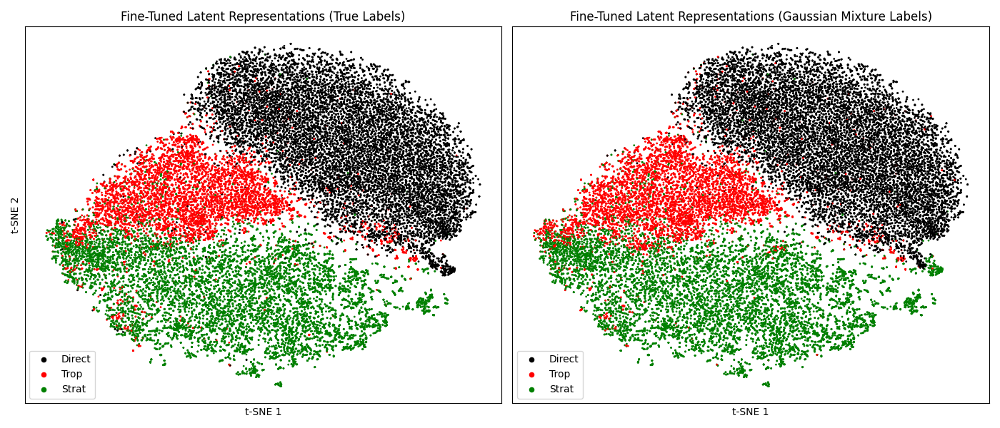

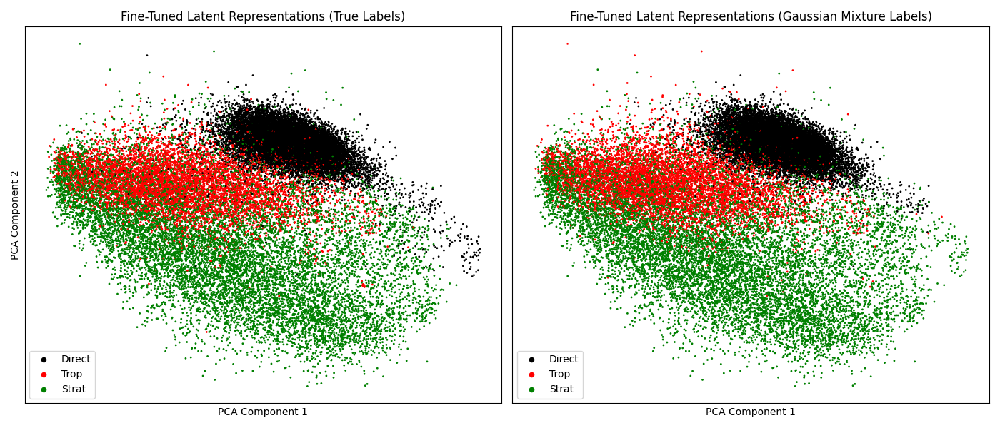

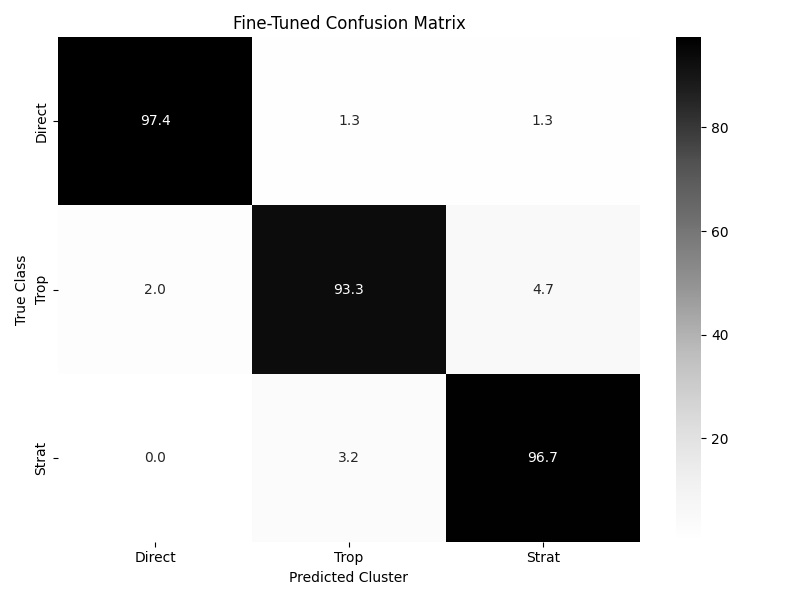

In [8]:
%%time
# Evaluate fine-tuned latent space
proj_model = tf.keras.Model(
    inputs=dec_model.inputs,
    outputs=dec_model.get_layer("Proj_LN_1").output)

res = mcaap.eval_latent_space(
    proj_model=proj_model,
    data_inputs=[X_scalo_crop, X_env_crop, X_sin_crop, X_cos_crop],
    X_label=X_label,
    n_clusters=3,
    cluster_ids=[2,0,1],
    title_1='Fine-Tuned Latent Representations (True Labels)',
    title_2='Fine-Tuned Latent Representations (Gaussian Mixture Labels)',
    title_3='Fine-Tuned Confusion Matrix',
    standardize=True,
    compute_acc=True,
    plot=True,
    random_state = GLOBAL_SEED,
    outpath_tsne="TSNE_Finetuned_Latent.png", 
    outpath_confusion_matrix="Finetuned_Confusion_Matrix.png")